# Master Fig 1

In [1]:
library(ggplot2)
library(patchwork)

In [2]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

## Load Subfigs

In [110]:
# UMAP + stats
daywise_umap = readRDS("./subfigs/20200921_daywise_umap.rds")
daywise_counts = readRDS("./subfigs/20200707_daywise_cell_count.rds")
clusterwise_umap = readRDS("./subfigs/20200921_clusterwise_umap.rds")
clusterwise_counts = readRDS("./subfigs/20200921_clusterwise_cell_count.rds")

rna_daywise_umap = readRDS("./subfigs/20200921_rna_daywise_umap.rds")
rna_daywise_counts = readRDS("./subfigs/20200921_rna_daywise_cell_count.rds")
rna_clusterwise_umap = readRDS("./subfigs/20200921_rna_clusterwise_umap.rds")
rna_clusterwise_counts = readRDS("./subfigs/20200921_rna_clusterwise_cell_count.rds")

# possible in supps?
# day_by_cluster = readRDS("./subfigs/20200707_day_by_cluster_breakdown.rds")
# cluster_by_day = readRDS("./subfigs/20200707_cluster_by_day_breakdown.rds")

In [153]:
# FRiP plots
fibroblast_frip = readRDS("./subfigs/20200921_fibroblast_frip.rds")
ipsc_frip = readRDS("./subfigs/20200921_ipsc_frip.rds")

In [165]:
# gene expr scores
fibroblast_expr_score = readRDS("./subfigs/20200921_fibroblast_expr_score.rds")
pluri_expr_score = readRDS("./subfigs/20200921_pluripotency_expr_score.rds")

In [5]:
# gene score heatmap
gene_score_heatmap = readRDS("./subfigs/20200712_gene_score_ch_heatmap.rds")

In [27]:
# gene score plots
COL1A1_gs = readRDS("./subfigs/20200712_COL1A1_gs.rds")
FN1_gs = readRDS("./subfigs/20200921_FN1_gs.rds")
CDH1_gs = readRDS("./subfigs/20200712_CDH1_gs.rds")
NANOG_gs = readRDS("./subfigs/20200712_NANOG_gs.rds")
OCT4_gs = readRDS("./subfigs/20200712_POU5F1_gs.rds")

In [37]:
# single-cell gene expression plots
COL1A1_expr_sc = readRDS("./subfigs/20200921_COL1A1_expr_sc.rds")
FN1_expr_sc = readRDS("./subfigs/20200921_FN1_expr_sc.rds")
CDH1_expr_sc = readRDS("./subfigs/20200921_CDH1_expr_sc.rds")
NANOG_expr_sc = readRDS("./subfigs/20200921_NANOG_expr_sc.rds")

In [6]:
# cluster-wise browser shots
COL1A1 = readRDS("./subfigs/20200921_COL1A1_atac.rds")
FN1 = readRDS("./subfigs/20200921_FN1_atac.rds")
CDH1 = readRDS("./subfigs/20200921_CDH1_atac.rds")
NANOG = readRDS("./subfigs/20200921_NANOG_atac.rds")

COL1A1_gene = readRDS("./subfigs/20200921_COL1A1_atac_gene.rds")
FN1_gene = readRDS("./subfigs/20200921_FN1_atac_gene.rds")
CDH1_gene = readRDS("./subfigs/20200921_CDH1_atac_gene.rds")
NANOG_gene = readRDS("./subfigs/20200921_NANOG_atac_gene.rds")

# browser_labels = readRDS("./subfigs/20200921_browser_labels.rds")

# cluster-wise gene expression 
COL1A1_expr = readRDS("./subfigs/20200921_COL1A1_expr.rds")
FN1_expr = readRDS("./subfigs/20200921_FN1_expr.rds")
CDH1_expr = readRDS("./subfigs/20200921_CDH1_expr.rds")
NANOG_expr = readRDS("./subfigs/20200921_NANOG_expr.rds")

### Configs

In [10]:
cluster_config = read.table("../configs/cluster.tsv", comment.char = '', header=T, sep='\t')
cluster_config$colour = as.character(cluster_config$colour)
cluster_config$description = as.character(cluster_config$description)

rownames(cluster_config) = cluster_config$cluster
cluster_config

,cluster,colour,description,new_cluster
,<int>,<chr>,<chr>,<int>
1,1,#F4D5CD,Intermediate,12
2,2,#78A824,Pre-iPSC,15
3,3,#F01D35,Fibroblast-like,5
4,4,#E85F6D,Fibroblast-like,3
5,5,#B03743,Fibroblast,1
6,6,#7C2730,Fibroblast,2
7,7,#CF175A,Fibroblast-like,4
8,8,#CCCCCC,Doublets,17
9,9,#F7A6C2,Keratinocyte-like,6


In [96]:
# slight tweak for long name
cluster_config[11, "description"] = "Partial"

## Assemble Components

In [58]:
horizontal_spacers <- function(plot, widths=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), widths=widths)
}

vertical_spacers <- function(plot, heights=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), ncol=1, heights=heights)
}

placeholder_plot <- function(text, size=1) {
    df = data.frame(x=c(0), y=c(0), t=c(text))
    ggplot(df)+
    geom_text(aes(x=x,y=y,label=t), size=size)+
    theme_void()+
    theme(panel.border = element_rect(colour = "black", fill=NA, size=0.5),
                                                       plot.margin = unit(c(0,0,0,0), "pt"))
}

### UMAPs

In [112]:
atac_cell_counts_stacked = wrap_plots(list(daywise_counts, clusterwise_counts), ncol=1, heights=c(1,2))

In [111]:
rna_cell_counts_stacked = wrap_plots(list(rna_daywise_counts, rna_clusterwise_counts), ncol=1, heights=c(1,2))

In [113]:
atac_umaps_combined = wrap_plots(plot_spacer(),
                            daywise_umap + theme(plot.margin = unit(c(0,0,0,0), "pt")), 
                            plot_spacer(),
                            clusterwise_umap + theme(plot.margin = unit(c(0,0,0,0), "pt")), 
                            atac_cell_counts_stacked,
                            plot_spacer(),
                            widths=c(0,9,0,9,1,0.2))

rna_umaps_combined = wrap_plots(plot_spacer(),
                            rna_daywise_umap + theme(plot.margin = unit(c(0,0,0,0), "pt")), 
                            plot_spacer(),
                            rna_clusterwise_umap + theme(plot.margin = unit(c(0,0,0,0), "pt")), 
                            rna_cell_counts_stacked,
                            plot_spacer(),
                            widths=c(0,9,0,9,1,0.2))

umaps_combined = wrap_plots(atac_umaps_combined,
                           rna_umaps_combined,
                           ncol=1,
                           heights=c(9,8))

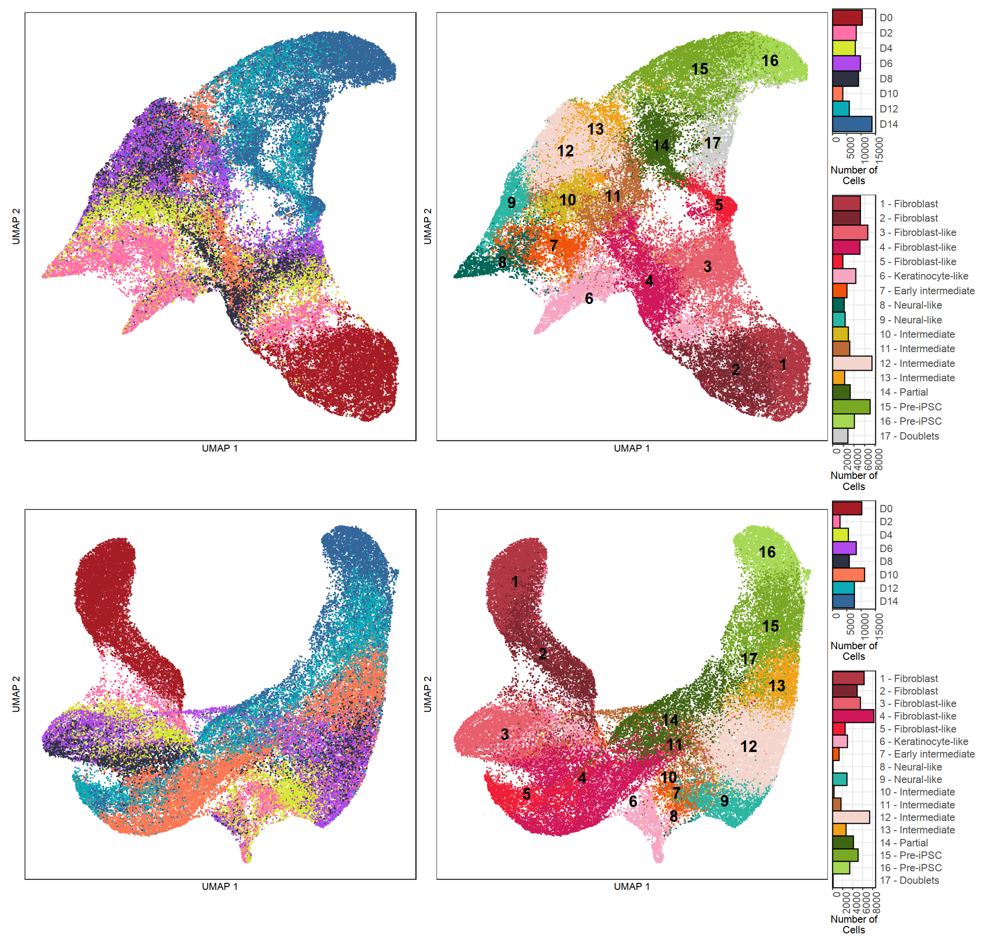

In [114]:
options(repr.plot.width = 18, repr.plot.height = 17)
umaps_combined

### Day x Cluster Breakdown

In [14]:
composition_plot = wrap_plots(day_by_cluster, 
           plot_spacer(), # otherwise "Day overlaps with plot below" 
           cluster_by_day,
           ncol=1,
           heights=c(5,0,5))

# y padding
composition_plot = vertical_spacers(composition_plot,
                       heights=c(1,5,1))

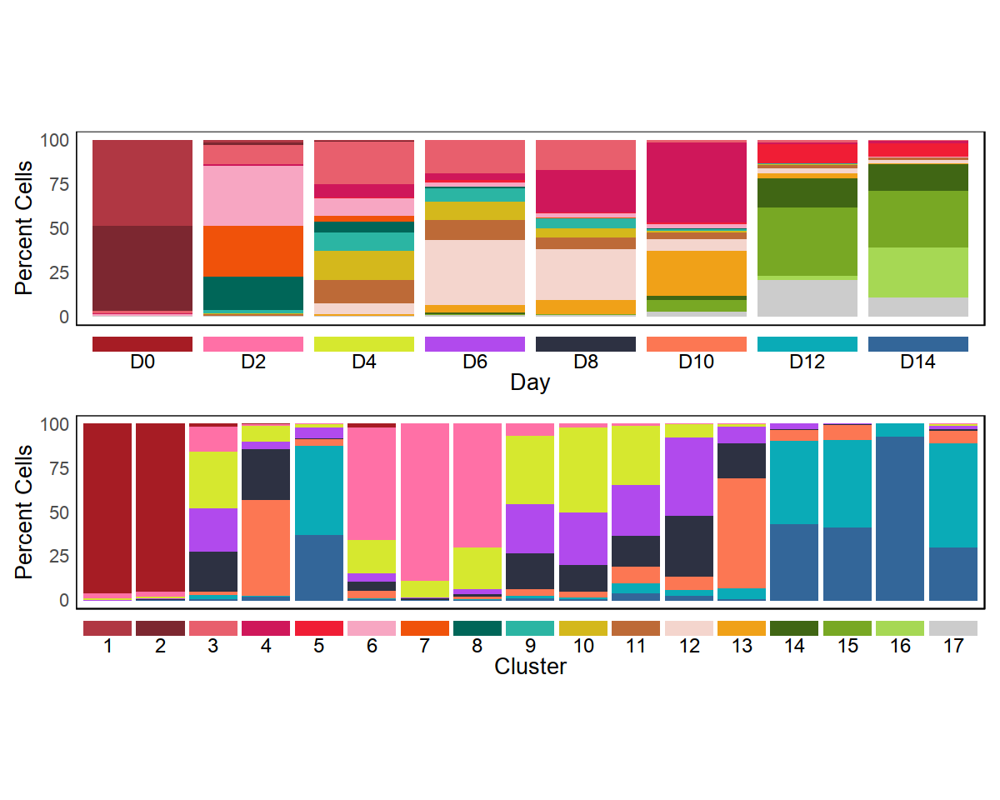

In [15]:
options(repr.plot.width = 10, repr.plot.height = 8)
composition_plot

### FRiP Plot

In [155]:
frip_plots = wrap_plots(horizontal_spacers(fibroblast_frip), 
           plot_spacer(), # otherwise "Day overlaps with plot below" 
           horizontal_spacers(ipsc_frip),
           widths=c(10,0.5,10))

# y padding
# frip_plots = vertical_spacers(frip_plots,
#                        heights=c(0.5,9,0.5))

In [166]:
expr_score_plots = wrap_plots(horizontal_spacers(fibroblast_expr_score), 
           plot_spacer(), # otherwise "Day overlaps with plot below" 
           horizontal_spacers(pluri_expr_score),
           widths=c(10,0.5,10))

# y padding
# expr_score_plots = vertical_spacers(frip_plots,
#                        heights=c(0.5,9,0.5))

### Row 1: Col 1

In [167]:
row1_col1_plots = horizontal_spacers(wrap_plots(vertical_spacers(placeholder_plot("SCHEMATIC", 10)),
                            frip_plots,
                            expr_score_plots,
                            heights=c(10,3.5,3.5)),
                                     c(0.1,8.9,0))

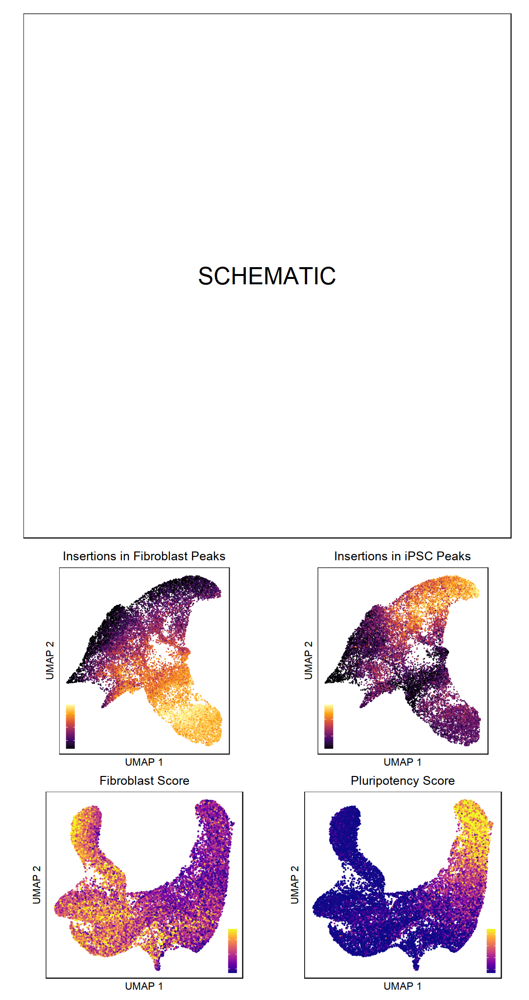

In [168]:
options(repr.plot.width = 9, repr.plot.height = 17)
row1_col1_plots

### Row 2: Option 2

In [18]:
row2_r1 = wrap_plots(horizontal_spacers(day_by_cluster, widths=c(0.2,6.6,0.2)), 
                     horizontal_spacers(cluster_by_day, widths=c(0.2,6.6,0.2)))
row2_r2 = wrap_plots(horizontal_spacers(fibroblast_frip, widths=c(1.5,6,0)),
                          horizontal_spacers(ipsc_frip, widths=c(1.5,6,0)))

In [19]:
row2_option2_components = wrap_plots(row2_r1,
                        plot_spacer(),
                        row2_r2,
                        heights=c(2.5,0, 6.5))

In [20]:
row2_option2_plots = wrap_plots(row2_option2_components,
                              vertical_spacers(horizontal_spacers(gene_score_heatmap, widths=c(1,7,1))),
                              widths=c(15,11))

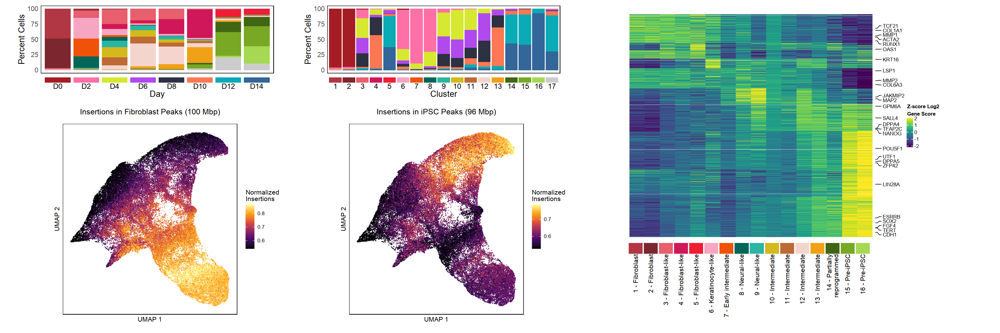

In [21]:
options(repr.plot.width = 27, repr.plot.height = 9)
row2_option2_plots

### Browser Shots with Gene Scores

In [12]:
cluster_label_df = cluster_config

# BOTTOM_PT = nrow(cluster_label_df)+0

# cluster_label_df[nrow(cluster_label_df)+1, ] = c(nrow(cluster_label_df)+1, "", "", 1)
# cluster_label_df[nrow(cluster_label_df)+1, ] = c(nrow(cluster_label_df)+1, "", "", BOTTOM_PT)

# need to play around with these parameters to find the right fit
cluster_labels_plot <- ggplot(cluster_label_df) +
    geom_text(aes(x=0, y= -as.numeric(new_cluster), label=description, hjust=1, vjust=0.5)) +
    theme_void() +
    theme(plot.margin = unit(c(0,-105,0,0), "pt"))
# wrap
cluster_labels_plot = wrap_plots(plot_spacer(), cluster_labels_plot, plot_spacer(), widths=c(0,1,0))


# add to debug- shows how ggplot dots align with genome track labels
# for (i in seq(1,18)) {
#     cluster_labels_plot = cluster_labels_plot + geom_point(x=0, y= -i)
# }

# cluster_labels_plot = cluster_labels_plot + geom_point(x=0, y= -BOTTOM_PT, colour='red')

In [18]:
# GS_TO_BROWSER_RATIO = c(10, 4)
# GS_HORIZONTAL_SPACERS = c(1,8,1)

top_plots = wrap_plots(cluster_labels_plot,
                    COL1A1,
                    COL1A1_expr,
                    plot_spacer(),                    
                    FN1,
                    FN1_expr,
                    plot_spacer(),
                    CDH1,
                    CDH1_expr,
                    plot_spacer(),
                    NANOG,
                    NANOG_expr,
                    widths=c(2,5.5,1,0,5.5,1,0,5.5,1,0,5.5,1))

bottom_plots = wrap_plots(
    plot_spacer(),
    COL1A1_gene,
    plot_spacer(),
    FN1_gene,
    plot_spacer(),
    CDH1_gene,
    plot_spacer(),
    NANOG_gene,
    plot_spacer(),
    widths=c(2,5.5,1,5.5,1,5.5,1,5.5,1)
)

atac_plus_expr = wrap_plots(top_plots, bottom_plots, heights=c(11,1))

In [38]:
gs_plus_expr = wrap_plots(
    plot_spacer(),
    COL1A1_gs,
    COL1A1_expr_sc,
    FN1_gs,
    FN1_expr_sc,
    CDH1_gs,
    CDH1_expr_sc,
    NANOG_gs,
    NANOG_expr_sc,
    widths=c(2,3.25,3.25,3.25,3.25,3.25,3.25,3.25,3.25))

In [107]:
browser_shots= wrap_plots(horizontal_spacers(atac_plus_expr),
                          horizontal_spacers(gs_plus_expr),
                          heights=c(12,3))

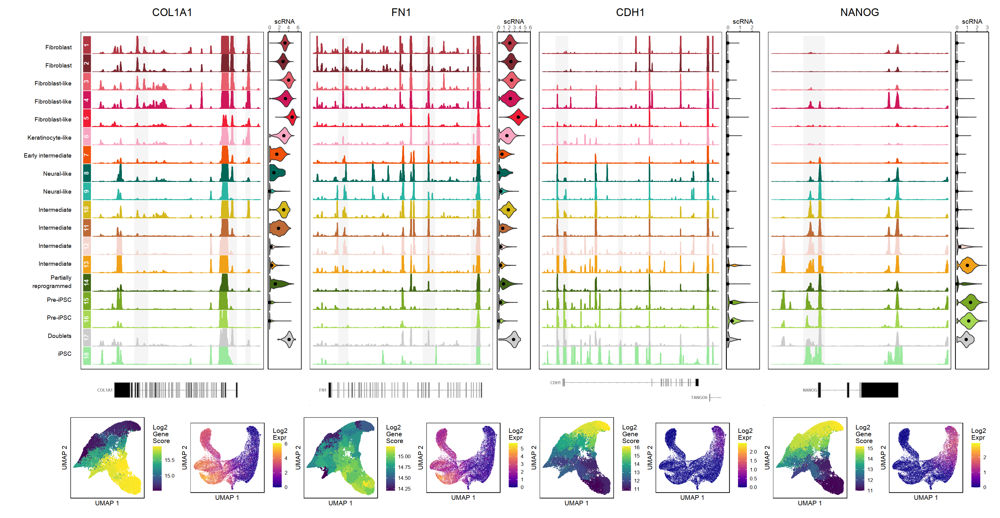

In [108]:
options(repr.plot.width = 27, repr.plot.height = 14)

browser_shots

## Assemble Master

In [169]:
main_fig = wrap_plots(wrap_plots(row1_col1_plots,
                                 vertical_spacers(umaps_combined), 
                                 widths=c(9,18)),                                  
                      browser_shots, 
                      ncol=1, heights=c(17,14))

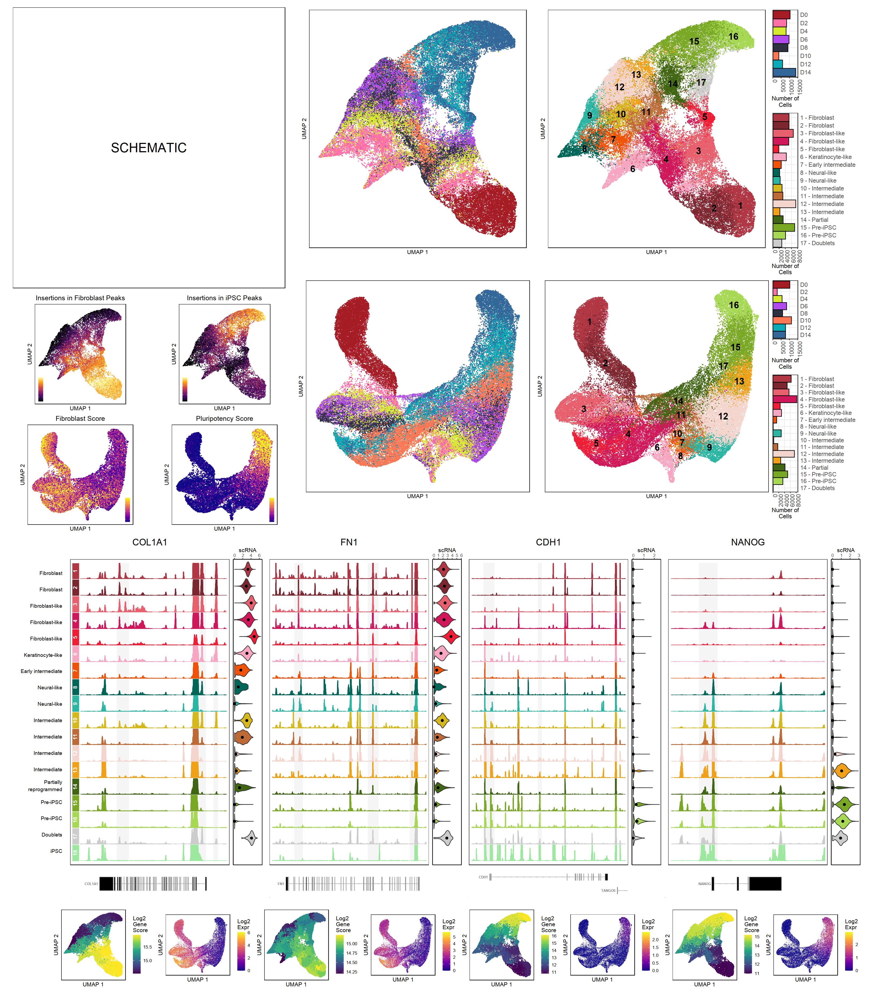

In [170]:
options(repr.plot.width = 27, repr.plot.height = 31)
main_fig

In [164]:
ggsave("tmp.pdf", main_fig, height=31, width=27)